# Deep Metric Learning 

## Dependencies & Utilities

In [1]:
import os
# SET THE FALLBACK VARIABLE BEFORE TORCH IS IMPORTED
os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1' #I need this to use the mac GPU (some operations are not supported on MPS)

In [2]:
# general
import random
import numpy as np
import matplotlib.pyplot as plt

# huggingface
from transformers import AutoModel
from datasets import load_dataset

# qdrant
from qdrant_client import QdrantClient
from qdrant_client import models

# torch
import torch
from torch import optim
from torch.utils.data import DataLoader

# pytorch metric learning
from pytorch_metric_learning import distances, losses, miners, reducers

# torchvision
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils

# PIL
from PIL import Image
import PIL.ImageOps    

## Data 

The `CustomDataset` class is needed to make use of the `DataLoader` API

In [3]:
from src.dataset import CustomDataset, FlatFolderLoader

root_dir = 'Metadata_dataset'  # Assuming the 'Train' and 'Test' folders are in the current directory

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])


flat_loader = FlatFolderLoader()
example_dataset = CustomDataset(transform=transform)
example_dataset.add_data(flat_loader,root_dir,'Train')

example_dataloader = DataLoader(example_dataset, batch_size=8, shuffle=True)

dataiter = iter(example_dataloader)


example_batch = next(dataiter)

torch.Size([8, 3, 256, 256])
torch.Size([8])
Label 0


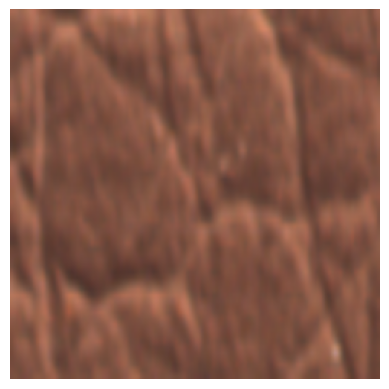

In [4]:
print(example_batch[0].shape) # batched img 
print(example_batch[1].shape) # batched labels


inbatch_index = 6
print("Label", example_batch[1][inbatch_index].item())
plt.axis("off")
plt.imshow(example_batch[0][inbatch_index].numpy().transpose(1, 2, 0))

## 3. CNN for metric learning

In [5]:
from src.cnn import SiameseNetwork, ViTNetwork

### Training data & augmentation

In [11]:
root_dir = 'Metadata_dataset'  # Assuming the 'Train' and 'Test' folders are in the current directory

# Data augmentation 
training_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.Resize((256, 256)),
    transforms.RandomApply(
        transforms=[
            transforms.RandomRotation(degrees=30),
            transforms.CenterCrop(size=(200,200))]),
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

simple_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# Create DataLoaders for both Train and Test sets
train_dataset = CustomDataset(transform=training_transform)
train_dataset.add_data(flat_loader,root_dir,'Train')
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

test_dataset = CustomDataset(transform=simple_transform)
train_dataset.add_data(flat_loader,root_dir,'Test')
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

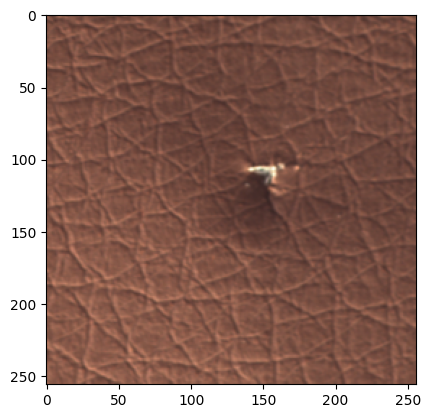

In [13]:
data_iter = iter(train_dataloader)
example_batch = next(data_iter)
inbatch_index = 5
plt.imshow(example_batch[0][inbatch_index].numpy().transpose(1, 2, 0))

### Training with triplet loss

In [18]:
# Define device (will still try to use MPS first)
if torch.cuda.is_available():
    device_name = 'cuda'
elif torch.backends.mps.is_available():
    # Check for Metal Performance Shaders (MPS) on Apple Silicon GPUs
    # is_available() checks if MPS is available for use.
    device_name = 'mps'
else:
    # Fallback to CPU if neither CUDA nor MPS is available
    device_name = 'cpu'

# Create the torch.device object
device = torch.device(device_name)
print(f"Using device: {device}")

# Instantiate the base model and the build the siamese network on top of it
base_model = AutoModel.from_pretrained("facebook/dinov2-base").to(device)
net = SiameseNetwork(base_model,
                     embedding_dim=base_model.config.hidden_size,
                     projection_dim=base_model.config.hidden_size,
                     proj_hidden_dim=base_model.config.hidden_size)
net = net.to(device)

# Define parameters
margin = 0.1 # Example margin value
learning_rate = 0.0001

# 1. Define the Distance Metric
distance = distances.LpDistance() #euclidean

# 2. Define the Reducer
#    This averages the loss over the non-zero triplets found by the miner.
reducer = reducers.AvgNonZeroReducer()

# 3. Define the Loss Function (TripletMarginLoss is standard for triplets)
loss_func = losses.TripletMarginLoss(margin=margin,
                                     distance=distance,
                                     reducer=reducer)

# 4. Define the Miner (This performs the HARD BATCH MINING)
#    type_of_triplets='hard' ensures it finds the hardest positive and hardest negative
#    for each anchor within the batch.
miner = miners.TripletMarginMiner(margin=margin, # Use same margin for consistency
                                  distance=distance,
                                  type_of_triplets='hard')

# 5. Define the Optimizer
optimizer = optim.Adam(net.parameters(), lr=learning_rate)

Using device: mps


In [ ]:
# # --- Placeholder Setup for Logging ---
# counter = []
# loss_history = []
# iteration_number = 0
# # --- End Placeholder Setup ---

# # --- Modified Training Loop using pytorch-metric-learning ---
# num_epochs = 50
# net.train()

# print("Starting Training...")
# for epoch in range(num_epochs):
#     cumulated_loss = 0.0
#     total_triplets = 0

#     for i, data in enumerate(train_dataloader, 0):
#         images, labels = data
#         images = images.to(device)
#         labels = labels.to(device)

#         optimizer.zero_grad()

#         # Get embeddings from the network
#         embeddings = net(images)

#         # Use the miner to find hard triplets within the batch
#         # miner returns indices: (anchor_indices, positive_indices, negative_indices)
#         hard_triplets = miner(embeddings, labels)

#         # Calculate the loss using the loss function and the mined triplets
#         # The loss function needs embeddings, labels, and the indices_tuple from the miner
#         loss = loss_func(embeddings, labels, hard_triplets)

#         # Backward pass and optimize
#         loss.backward()
#         optimizer.step()

#         # --- Logging ---
#         # -> triplets
#         num_triplets_found = miner.num_triplets # Get number of triplets found by the miner in this batch
#         total_triplets += num_triplets_found
#         # -> loss
#         current_loss = loss.item()
#         cumulated_loss += current_loss*num_triplets_found
        
#     # Note: loss weigthed average per epoch
#     print(f"--- Epoch {epoch+1} Finished ---")
#     if(total_triplets > 0):
#         print(f"Avg Loss: {cumulated_loss/total_triplets:.4f}")
#     print(f"Total Triplets Found: {total_triplets}")

# print('Finished Training')

### Training with ArcFace loss

In [9]:
# Define device (will still try to use MPS first)
if torch.cuda.is_available():
    device_name = 'cuda'
elif torch.backends.mps.is_available():
    # Check for Metal Performance Shaders (MPS) on Apple Silicon GPUs
    # is_available() checks if MPS is available for use.
    device_name = 'mps'
else:
    # Fallback to CPU if neither CUDA nor MPS is available
    device_name = 'cpu'

# Create the torch.device object
device = torch.device(device_name)
print(f"Using device: {device}")

# Instantiate the base model and the build the siamese network on top of it
base_model = AutoModel.from_pretrained("facebook/dinov2-base").to(device)
net = ViTNetwork(base_model, 10)
net = net.to(device)

# Define parameters
learning_rate = 0.0001


# Define the Loss Function (TripletMarginLoss is standard for triplets)
loss_func = losses.ArcFaceLoss(num_classes=6,
                               embedding_size=1536,
                               margin=28.6,
                               scale=64.0).to(device)


# 5. Define the Optimizer
optimizer = optim.Adam([
    {'params': net.parameters()},
    {'params': loss_func.parameters()} # Add loss function parameters
], lr=learning_rate)

Using device: mps
Unfreezing layer: encoder.layer.11.layer_scale1.lambda1
Unfreezing layer: encoder.layer.11.norm2.weight
Unfreezing layer: encoder.layer.11.norm2.bias
Unfreezing layer: encoder.layer.11.mlp.fc1.weight
Unfreezing layer: encoder.layer.11.mlp.fc1.bias
Unfreezing layer: encoder.layer.11.mlp.fc2.weight
Unfreezing layer: encoder.layer.11.mlp.fc2.bias
Unfreezing layer: encoder.layer.11.layer_scale2.lambda1
Unfreezing layer: layernorm.weight
Unfreezing layer: layernorm.bias


In [14]:
# --- Placeholder Setup for Logging ---
counter = []
loss_history = []
iteration_number = 0
# --- End Placeholder Setup ---

# --- Modified Training Loop using pytorch-metric-learning ---
num_epochs = 50
net.train()
loss_func.train()

print("Starting Training with ArcFace Loss...")
for epoch in range(num_epochs):
    epoch_loss = 0.0 # Accumulator for the average batch losses

    for i, data in enumerate(train_dataloader, 0):
        images, labels = data
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Get embeddings from the network
        embeddings = net(images)

        # Calculate the loss using ArcFaceLoss
        # ArcFaceLoss takes embeddings and labels directly
        loss = loss_func(embeddings, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # --- Logging ---
        current_batch_loss = loss.item()
        epoch_loss += current_batch_loss # Accumulate the average loss of the batch

        # Optional: Print batch loss periodically
        if (i + 1) % 100 == 0: # Print every 100 batches
             print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(train_dataloader)}], Batch Loss: {current_batch_loss:.4f}")

        iteration_number += 1
        # You could store batch loss in a list here if needed:
        # loss_history_batch.append(current_batch_loss)

    # --- Epoch End Logging ---
    # Calculate average loss over all batches in the epoch
    average_epoch_loss = epoch_loss / len(train_dataloader)
    loss_history.append(average_epoch_loss) # Store epoch average loss

    print(f"--- Epoch {epoch+1} Finished ---")
    print(f"Average Epoch Loss: {average_epoch_loss:.4f}")
    # Removed triplet count logging as it's not relevant for ArcFace

print('Finished Training')

Starting Training with ArcFace Loss...
--- Epoch 1 Finished ---
Average Epoch Loss: 34.4662
--- Epoch 2 Finished ---
Average Epoch Loss: 33.1018
--- Epoch 3 Finished ---
Average Epoch Loss: 30.3293
--- Epoch 4 Finished ---
Average Epoch Loss: 29.9490
--- Epoch 5 Finished ---
Average Epoch Loss: 29.2846
--- Epoch 6 Finished ---
Average Epoch Loss: 26.7451
--- Epoch 7 Finished ---
Average Epoch Loss: 25.0302
--- Epoch 8 Finished ---
Average Epoch Loss: 26.2836
--- Epoch 9 Finished ---
Average Epoch Loss: 23.9753
--- Epoch 10 Finished ---
Average Epoch Loss: 22.8111
--- Epoch 11 Finished ---
Average Epoch Loss: 19.4738
--- Epoch 12 Finished ---
Average Epoch Loss: 21.4237
--- Epoch 13 Finished ---
Average Epoch Loss: 15.7810
--- Epoch 14 Finished ---
Average Epoch Loss: 15.2650
--- Epoch 15 Finished ---
Average Epoch Loss: 14.1091
--- Epoch 16 Finished ---
Average Epoch Loss: 17.6235
--- Epoch 17 Finished ---
Average Epoch Loss: 18.0656
--- Epoch 18 Finished ---
Average Epoch Loss: 16.422

In [15]:
torch.save(net.state_dict(), './models/finetuned-arcface-ViT.pth')
#net.load_state_dict(torch.load('./models/siamese_net.pth'))

## 4. Embeddings

Let's create a function with the process we just walked through above and map it to our dataset to get an
embedding vector for each image.

In [16]:
def get_embeddings(batch, transform=None, should_invert=False):    
    images = batch['image']
    
    input_tensors = [transform(img) for img in images]
    inputs = torch.stack(input_tensors).to(device)
    
    with torch.no_grad():
        embeddings = net(inputs).cpu().numpy() 
    batch['embeddings'] = embeddings
    return batch

def get_base_embeddings(batch, transform=None, should_invert=False):    
    images = batch['image']
    
    input_tensors = [transform(img) for img in images]
    inputs = torch.stack(input_tensors).to(device)
    
    with torch.no_grad():
        embeddings = net.get_base_embeddings(inputs).cpu().numpy() 
    batch['base_embeddings'] = embeddings
    return batch    

In [17]:
dataset = load_dataset("imagefolder", data_dir='./Metadata_dataset/Train/', split='train')


Resolving data files:   0%|          | 0/48 [00:00<?, ?it/s]

In [ ]:
net.eval()
dataset = dataset.map(get_embeddings, batched=True, batch_size=1, 
                      fn_kwargs={"transform": transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()]), 
                                "should_invert": False})

# dataset = dataset.map(get_base_embeddings, batched=True, batch_size=1, 
#                       fn_kwargs={"transform": transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()]), 
#                                 "should_invert": False})

dataset

Map:   0%|          | 0/47 [00:00<?, ? examples/s]

Map:   0%|          | 0/47 [00:00<?, ? examples/s]

AttributeError: 'ViTNetwork' object has no attribute 'get_base_embeddings'

#### Visualize

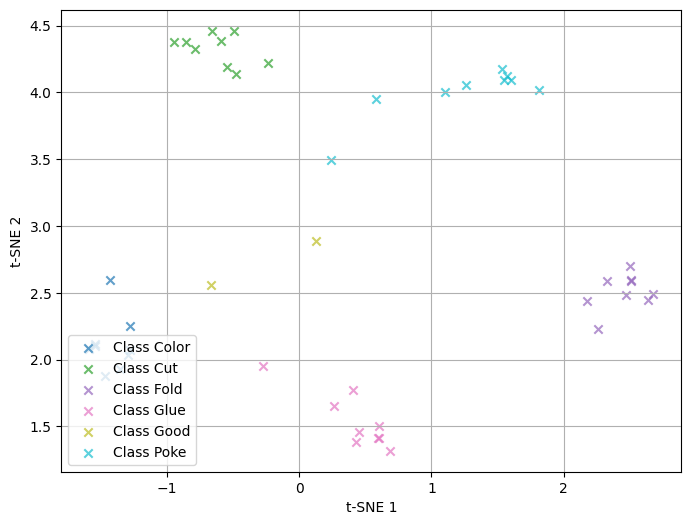

In [21]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)

#base_embeddings = np.array(dataset['base_embeddings'])
embeddings = np.array(dataset['embeddings'])

y_train = np.array(dataset['class'])

unique_labels = np.unique(y_train)
cmap = plt.get_cmap('tab10', len(unique_labels)) # Get a colormap

# tsne_transformed_embeddings = tsne.fit_transform(base_embeddings)
# plt.figure(figsize=(8, 6))
# for i, label in enumerate(unique_labels):
#     class_color = cmap(i /(len(unique_labels)-1)) # Assign color based on class index
#     idx = y_train == label
#     plt.scatter(tsne_transformed_embeddings[idx, 0], tsne_transformed_embeddings[idx, 1], 
#                 label=f"Class {label}", alpha=0.7, marker='o',color=class_color)
    
# plt.xlabel("t-SNE 1")
# plt.ylabel("t-SNE 2")
# plt.legend()
# plt.grid(True)
# plt.legend(loc='lower left')
# plt.show()



tsne_transformed_embeddings = tsne.fit_transform(embeddings)
plt.figure(figsize=(8, 6))
for i, label in enumerate(unique_labels):
    class_color = cmap(i /(len(unique_labels)-1)) # Assign color based on class index
    idx = y_train == label
    plt.scatter(tsne_transformed_embeddings[idx, 0], tsne_transformed_embeddings[idx, 1], 
                label=f"Class {label}", alpha=0.7, marker='x',color=class_color)

plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.grid(True)
plt.legend(loc='lower left')
plt.show()

### Store the embedded images in the vector database

Notice above that we now have an embedding for each of the images in our dataset, and that's exactly what we were hoping for.

We'll now save the vector of embeddings as a NumPy array so that we don't have to run it again later if
take a break or accidentally close down the tutorial. Then, what we want to do is to create a payload
with the metadata about each of our images. We can accomplish this by converting the rest of the
columns we didn't use into a JSON object for each sample.

In [22]:
np.save("vectors", np.array(dataset['embeddings']), allow_pickle=False)

In [23]:
payload = dataset.select_columns([
    "image_id", "class", 'description'
]).to_pandas().to_dict(orient="records")

payload[:3]

[{'image_id': 'color (1).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'},
 {'image_id': 'color (2).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'},
 {'image_id': 'color (3).png',
  'class': 'Color',
  'description': 'Color contamination on the leather'}]

In [24]:
client = QdrantClient(location=":memory:")

In [26]:
my_collection = "image_collection"
client.recreate_collection(
    collection_name=my_collection,
    vectors_config=models.VectorParams(size=1536, distance=models.Distance.COSINE) #TODO: inspect best distance metric
)

/var/folders/7g/9rtz76hn4j5_ws3_z5kszxk40000gn/T/ipykernel_13614/3924162909.py:2: DeprecationWarning: `recreate_collection` method is deprecated and will be removed in the future. Use `collection_exists` to check collection existence and `create_collection` instead.
  client.recreate_collection(


True

To make sure each image has an explicit `id` inside of the Qdrant collection we created earlier, we'll create a new column with a range of
numbers equivalent to the rows in our dataset. In addition, we'll load the embeddings we just saved.

In [27]:
ids = list(range(dataset.num_rows))
embeddings = np.load("vectors.npy").tolist()

We are now ready to upsert the combination of ids, vectors and payload to our collection, and we'll do so in batches of 1000.

In [28]:
batch_size = 1

for i in range(0, dataset.num_rows, batch_size):

    low_idx = min(i+batch_size, dataset.num_rows)

    batch_of_ids = ids[i: low_idx]
    batch_of_embs = embeddings[i: low_idx]
    batch_of_payloads = payload[i: low_idx]

    client.upsert(
        collection_name=my_collection,
        points=models.Batch(
            ids=batch_of_ids,
            vectors=batch_of_embs,
            payloads=batch_of_payloads
        )
    )

We can make sure our vectors were uploaded successfully by counting them with the `client.count()` method.

In [29]:
client.count(
    collection_name=my_collection,
    exact=True,
)

CountResult(count=47)

To visually inspect the collection we just created, we can scroll through our vectors with the `client.scroll()` method.

In [30]:
client.scroll(
    collection_name=my_collection,
    limit=5
)

([Record(id=0, payload={'image_id': 'color (1).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=1, payload={'image_id': 'color (2).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=2, payload={'image_id': 'color (3).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=3, payload={'image_id': 'color (4).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
  Record(id=4, payload={'image_id': 'color (5).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None)],
 5)

## 5. Semantic Search

Semantic search, in the context of vector databases and image retrieval, refers to a method of searching for information or images
based on their meaning or content rather than just using keywords. Imagine you're looking for a specific picture of a skin disease and you
don't know the file name or where it is stored. With semantic search, you can describe what you're looking for using words like
"red rashes with blisters," or you can upload an image that will get processed into an embedding vector, and the system will then analyze
the content of the images to find matches that closely match your description or input image.

Semantic search enables a more intuitive and efficient way of searching for images, making it easier to find what you're
looking for, even if you can't remember specific details or tags.

With Qdrant, we can get started searching through our collection with the `client.search()` method.

In [31]:
test_dataset = load_dataset("imagefolder", data_dir='/Users/marcogalliani/Projects/metric-learning/Metadata_dataset/Test', split='train')
test_dataset

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'image_id', 'class', 'description'],
    num_rows: 51
})

In [32]:
test_dataset = test_dataset.map(get_embeddings, batched=True, batch_size=1, 
                      fn_kwargs={"transform": transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()]), 
                                "should_invert": False})

Map:   0%|          | 0/51 [00:00<?, ? examples/s]

In [33]:
test_dataset[0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=192x160>,
 'image_id': 'color (1).png',
 'class': 'Color',
 'description': 'Color contamination on the leather',
 'embeddings': [-2.054386615753174,
  0.4408997893333435,
  -0.4073742628097534,
  0.5960409045219421,
  -2.9740726947784424,
  -0.6504238247871399,
  -1.2935736179351807,
  0.4781339168548584,
  -3.5656673908233643,
  -1.1346945762634277,
  1.6791784763336182,
  -0.3609763979911804,
  0.8464847803115845,
  1.6839269399642944,
  1.024302363395691,
  4.0831217765808105,
  -0.5622442960739136,
  1.0468956232070923,
  0.35799601674079895,
  -1.6832435131072998,
  0.9382116794586182,
  -0.04196125268936157,
  0.5445132851600647,
  3.0983402729034424,
  -0.6127679944038391,
  -0.1308867335319519,
  -0.04076880216598511,
  0.6612026691436768,
  -1.5249987840652466,
  -3.2420032024383545,
  -1.0075944662094116,
  0.925743579864502,
  1.7451231479644775,
  -1.3954052925109863,
  -1.3330858945846558,
  1.0863109827041626,

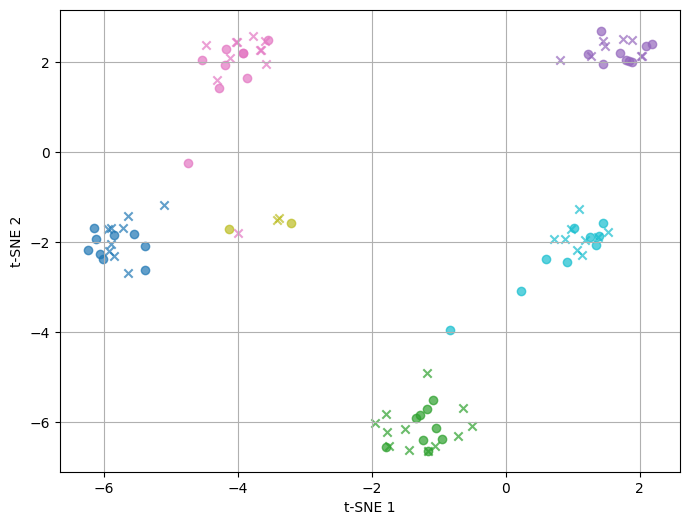

In [34]:
tsne = TSNE(n_components=2, random_state=42)

train_embeddings = np.array(dataset['embeddings'])
test_embeddings = np.array(test_dataset['embeddings'])

pooled_embeddings = np.concatenate(
    (train_embeddings,test_embeddings),
    axis=0)

tsne_transformed_embeddings = tsne.fit_transform(pooled_embeddings)

y_train = np.array(dataset['class'])
y_test = np.array(test_dataset['class'])

y_pooled = np.concatenate(
    (y_train,y_test),
    axis=0)

plt.figure(figsize=(8, 6))


unique_labels = np.unique(y_train)
cmap = plt.get_cmap('tab10', len(unique_labels)) # Get a colormap


for i, label in enumerate(unique_labels):
    class_color = cmap(i /(len(unique_labels)-1)) # Assign color based on class index
    idx = y_pooled == label
    idx = idx & (np.arange(len(y_pooled)) < len(y_train))
    plt.scatter(tsne_transformed_embeddings[idx, 0], tsne_transformed_embeddings[idx, 1], 
                label=f"Class {label}", alpha=0.7, marker='o',color=class_color)

for i, label in enumerate(unique_labels):
    class_color = cmap(i /(len(unique_labels)-1)) # Assign color based on class index
    idx = y_pooled == label
    idx = idx & (np.arange(len(y_pooled)) >= len(y_train))
    plt.scatter(tsne_transformed_embeddings[idx, 0], tsne_transformed_embeddings[idx, 1], 
                label=f"Class {label}", alpha=0.7, marker='x',color=class_color)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.show()

In [35]:
res = client.query_points(
    collection_name=my_collection,
    query=test_dataset[0]['embeddings'],
    limit=3
).points
res

[ScoredPoint(id=1, version=0, score=0.9299584596517434, payload={'image_id': 'color (2).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=5, version=0, score=0.9182221278140965, payload={'image_id': 'color (6).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=0, version=0, score=0.9057106158085884, payload={'image_id': 'color (1).png', 'class': 'Color', 'description': 'Color contamination on the leather'}, vector=None, shard_key=None, order_value=None)]

Test on all test images

In [36]:
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score, classification_report

classes_dict = {'Color': 0, 
                'Cut': 1, 
                'Fold': 2, 
                'Glue': 3, 
                'Good': 4, 
                'Poke': 5}

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

/var/folders/7g/9rtz76hn4j5_ws3_z5kszxk40000gn/T/ipykernel_13614/763490553.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2)


Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

Filter:   0%|          | 0/47 [00:00<?, ? examples/s]

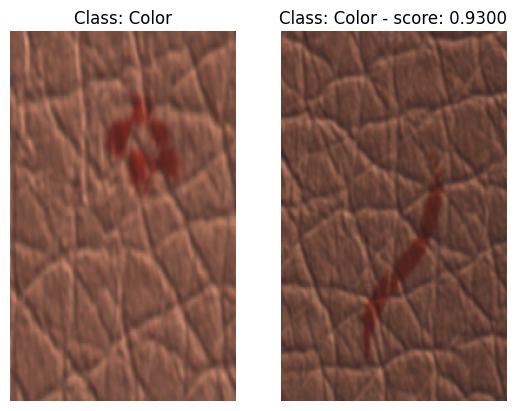

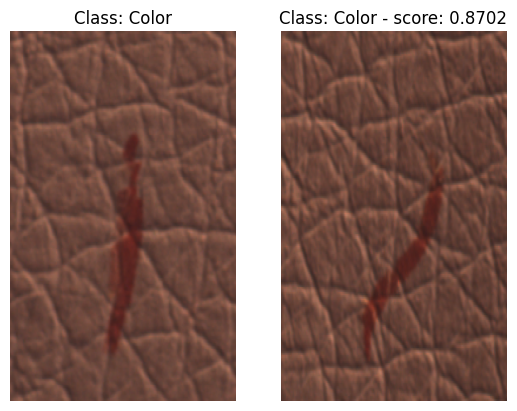

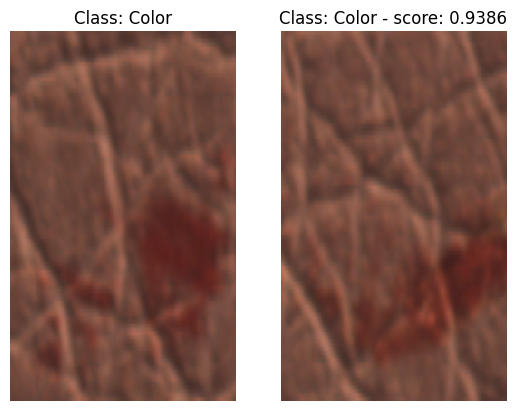

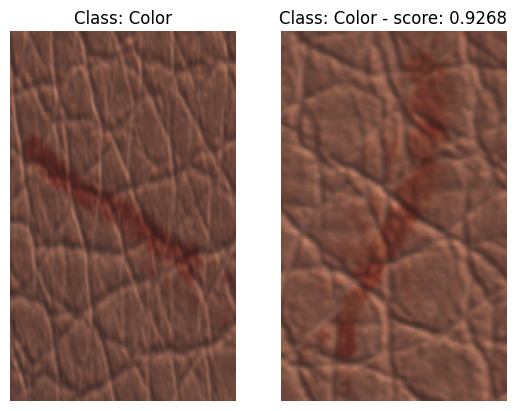

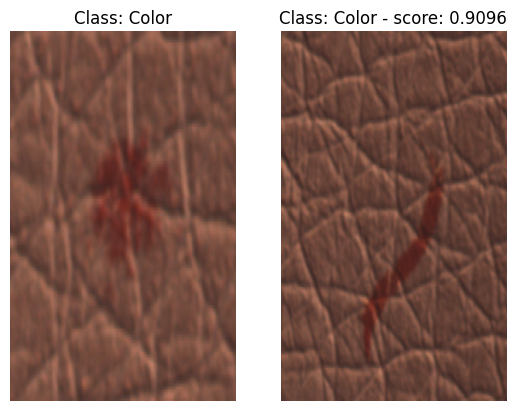

...

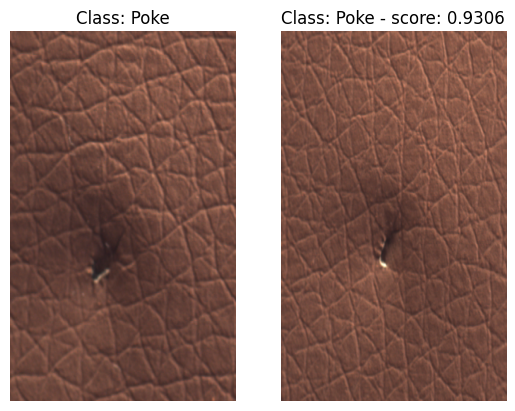

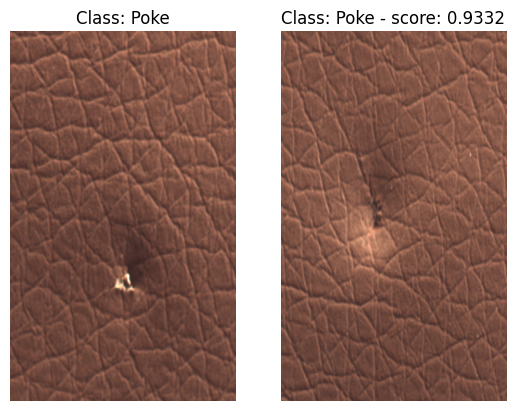

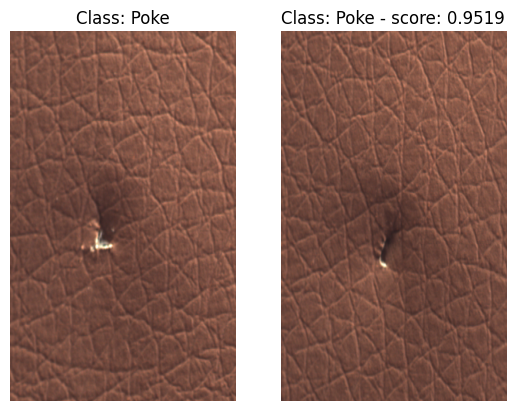

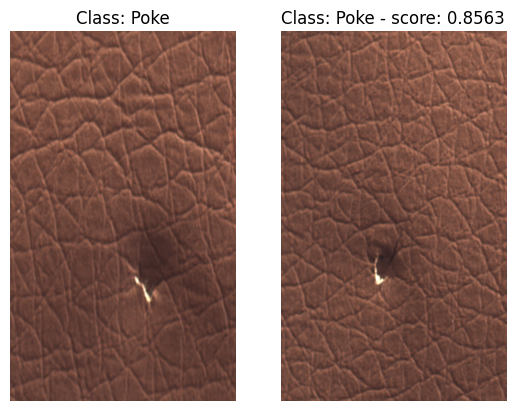

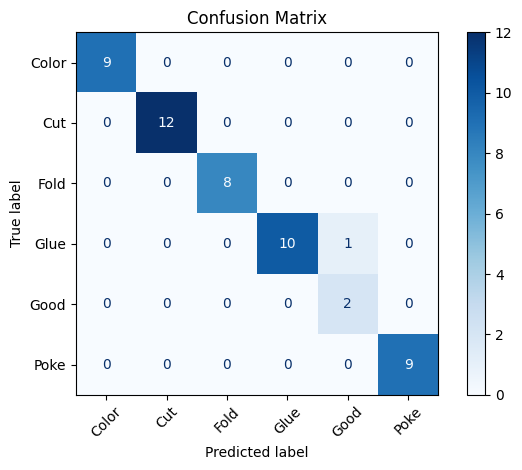

Classification Report:
              precision    recall  f1-score   support

       Color       1.00      1.00      1.00         9
         Cut       1.00      1.00      1.00        12
        Fold       1.00      1.00      1.00         8
        Glue       1.00      0.91      0.95        11
        Good       0.67      1.00      0.80         2
        Poke       1.00      1.00      1.00         9

    accuracy                           0.98        51
   macro avg       0.94      0.98      0.96        51
weighted avg       0.99      0.98      0.98        51



In [37]:
# Test all images in test dataset
y_true = []
y_pred = []
for img in test_dataset:
    result = client.query_points(
        collection_name=my_collection,
        query=img['embeddings'],
        limit=1
    ).points

    image_id = result[0].payload['image_id']
    image = dataset.filter(
            lambda x: x == image_id, input_columns="image_id"
        ).select_columns("image")[0]['image']

    # Append original class and predicted class
    y_true.append(classes_dict[img['class']])
    y_pred.append(classes_dict[result[0].payload['class']])

    # Display the original image and the found image using matplotlib together with score
    fig, axs = plt.subplots(1, 2)
    axs[0].imshow(img['image'], cmap="gray", aspect='auto')
    axs[0].set_title(f"Class: {img['class']}")
    axs[0].axis('off')
    axs[1].imshow(image, cmap="gray", aspect='auto')
    axs[1].set_title(f"Class: {result[0].payload['class']} - score: {result[0].score:1.4f}")
    axs[1].axis('off')

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(classes_dict.keys()))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

report = classification_report(y_true, y_pred, target_names=list(classes_dict.keys()))
print("Classification Report:")
print(report)

## Visualize results with t-SNE

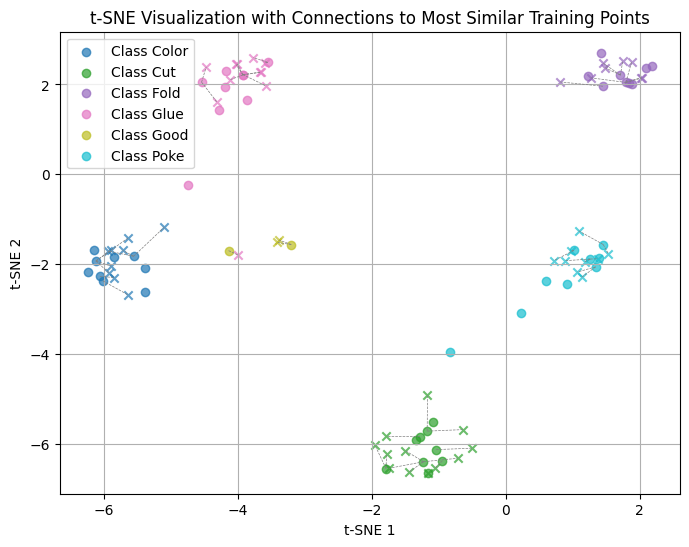

In [38]:
from sklearn.metrics.pairwise import cosine_similarity


tsne = TSNE(n_components=2, random_state=42, perplexity=30)

train_embeddings = np.array(dataset['embeddings'])
test_embeddings = np.array(test_dataset['embeddings'])

pooled_embeddings = np.concatenate(
    (train_embeddings,test_embeddings),
    axis=0)

tsne_transformed_embeddings = tsne.fit_transform(pooled_embeddings)

y_train = np.array(dataset['class'])
y_test = np.array(test_dataset['class'])

y_pooled = np.concatenate(
    (y_train,y_test),
    axis=0)

plt.figure(figsize=(8, 6))

unique_labels = np.unique(y_train)
cmap = plt.get_cmap('tab10', len(unique_labels)) # Get a colormap

# Plot training data
for i, label in enumerate(unique_labels):
    class_color = cmap(i / (len(unique_labels) - 1) if len(unique_labels) > 1 else cmap(0))
    idx_train = (y_pooled == label) & (np.arange(len(y_pooled)) < len(y_train))
    plt.scatter(tsne_transformed_embeddings[idx_train, 0], tsne_transformed_embeddings[idx_train, 1],
                label=f"Class {label}", alpha=0.7, marker='o', color=class_color)

# Plot test data and connect to most similar training point
for i_test in range(len(test_embeddings)):
    test_embedding = test_embeddings[i_test]
    # Calculate cosine similarity between the current test embedding and all training embeddings
    similarities = cosine_similarity(test_embedding.reshape(1, -1), train_embeddings)[0]
    # Find the index of the most similar training embedding
    most_similar_index = np.argmax(similarities)

    # Get the t-SNE coordinates of the test point and the most similar training point
    test_tsne = tsne_transformed_embeddings[len(train_embeddings) + i_test]
    train_tsne = tsne_transformed_embeddings[most_similar_index]

    # Get the class label of the test point to assign the correct color
    test_label = y_test[i_test]
    label_index = np.where(unique_labels == test_label)[0][0]
    class_color = cmap(label_index / (len(unique_labels) - 1) if len(unique_labels) > 1 else cmap(0))

    # Plot the test point with a different marker
    plt.scatter(test_tsne[0], test_tsne[1],
                label="", # Only add label once
                alpha=0.7, marker='x', color=class_color)

    # Plot the connecting line
    plt.plot([train_tsne[0], test_tsne[0]], [train_tsne[1], test_tsne[1]],
             color='gray', linestyle='--', linewidth=0.5)

plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.title("t-SNE Visualization with Connections to Most Similar Training Points")
plt.show()